### Libraries

In [1]:
%matplotlib inline

import datacube
import sys
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from odc.ui import DcViewer
from odc.ui import with_ui_cbk

sys.path.append("../Scripts")
from deafrica_plotting import display_map
from deafrica_plotting import rgb

from datacube.utils import geometry, masking
from datacube.utils.cog import write_cog
from datacube.helpers import write_geotiff

### Connect to the datacube

In [2]:
dc = datacube.Datacube(app="water")

In [3]:
dc.list_products().columns

Index(['name', 'description', 'creation_time', 'format', 'platform',
       'dataset_maturity', 'product_family', 'instrument', 'time', 'lon',
       'region_code', 'lat', 'label', 'crs', 'resolution', 'tile_size',
       'spatial_dimensions'],
      dtype='object')

### List of products

In [4]:
products = dc.list_products()

display_columns = ['name', 'description']

products[display_columns].sort_index()

,name,description
id,,
1,usgs_espa_ls5c1_sr,Landsat 5 USGS Collection 1 Surface Reflectanc...
2,usgs_espa_ls7c1_sr,Landsat 7 USGS Collection 1 Surface Reflectanc...
3,usgs_espa_ls8c1_sr,Landsat 8 USGS Collection 1 Surface Reflectanc...
4,usgs_espa_ls8c1_veg,Landsat 8 USGS Collection 1 Vegetation Indices...
5,usgs_espa_ls8c1_ar,Landsat 8 USGS Collection 1 Aquatic Reflectanc...
6,usgs_espa_ls8c1_toa,Landsat 8 USGS Collection 1 TOA and Brightness...
7,cophub_s2_sr_sen2cor,"Sentinel-2A/B ESA Surface Reflectance, process..."


In [5]:
product = "usgs_espa_ls5c1_sr"

measurements = dc.list_measurements()
measurements.loc[product]

,name,dtype,units,nodata,aliases,flags_definition
measurement,,,,,,
blue,blue,int16,reflectance,-9999,"[sr_band1, band_1]",NaN
green,green,int16,reflectance,-9999,"[sr_band2, band_2]",NaN
red,red,int16,reflectance,-9999,"[sr_band3, band_3]",NaN
nir,nir,int16,reflectance,-9999,"[sr_band4, band_4]",NaN
swir1,swir1,int16,reflectance,-9999,"[sr_band5, band_5]",NaN
swir2,swir2,int16,reflectance,-9999,"[sr_band7, band_7]",NaN
atmos_opacity,atmos_opacity,int16,1,-9999,[sr_atmos_opacity],NaN
pixel_qa,pixel_qa,uint16,bit_index,1,"[pixel_quality, level2_qa]","{'snow': {'bits': 4, 'values': {'0': 'no_snow'..."
radsat_qa,radsat_qa,uint8,bit_index,1,[saturation_qa],"{'data_fill': {'bits': 0, 'values': {'0': 'val..."


In [6]:
DcViewer(dc=dc, 
         time='2010',
         center=(-33.747505871541016, -71.70238809645036),
         zoom=6)

## Water Body Analysis

In [7]:
# Set the central latitude and longitude
# El Yali coordinates -33.777989, -71.700851
central_lat = -33.7960
central_lon = -71.7090

# Set the buffer to load around the central coordinates
buffer = 0.05

# Compute the bounding box for the study area
study_area_lat = (central_lat - buffer, central_lat + buffer)
study_area_lon = (central_lon - buffer, central_lon + buffer)

display_map(x=study_area_lon, y=study_area_lat)

In [8]:
# Set the date range to load data over
set_time = ("2013-01-01", "2020-12-01")

# Set the measurements/bands to load
# For this analysis, we'll load the red, green, blue and near-infrared bands
set_measurements = [
    "red",
    "blue",
    "green",
    "nir"
]

# Set the coordinate reference system and output resolution
set_crs = 'EPSG:32719'

set_resolution = (-30, 30)

availableProducts = [] 

for product in products["name"]:
    try:
        dataset = dc.load(
            product=product,
            x=study_area_lon,
            y=study_area_lat,
            output_crs = set_crs,
            time=set_time,
            resolution = set_resolution,
            dask_chunks={"time": 1}
        )
        if dataset != 0:
            availableProducts.append(product)
    except:
        print("product {} failed: {}".format(product, sys.exc_info()[0]))
        continue   

if len(availableProducts) == 0:
    print("Couldn't find any samples in any product :(")
else:
    print(availableProducts)


['cophub_s2_sr_sen2cor', 'usgs_espa_ls8c1_ar', 'usgs_espa_ls8c1_sr', 'usgs_espa_ls8c1_toa', 'usgs_espa_ls8c1_veg']


In [9]:
# Set the data source - s2a corresponds to Sentinel-2A
set_product = "usgs_espa_ls8c1_toa"

# Set the date range to load data over
set_time = ("2013-08-01", "2020-12-11") # 2014-04-01 - 8.2

# Set the measurements/bands to load
# For this analysis, we'll load the red, green, blue and near-infrared bands
set_measurements = [
    "red",
    "blue",
    "green",
    "nir"
]

# Set the coordinate reference system and output resolution
set_crs = 'EPSG:32719'

set_resolution = (-30, 30)

dataset = dc.load(
    product=set_product,
    x=study_area_lon,
    y=study_area_lat,
    output_crs = set_crs,
    time = set_time,
    #measurements=set_measurements,
    resolution = set_resolution,
    dask_chunks={"time": 1}
)

In [10]:
dataset

<xarray.Dataset>
Dimensions:          (time: 162, x: 319, y: 379)
Coordinates:
  * time             (time) datetime64[ns] 2013-08-02T14:35:40.958032 ... 202...
  * y                (y) float64 6.263e+06 6.263e+06 ... 6.252e+06 6.252e+06
  * x                (x) float64 2.444e+05 2.445e+05 ... 2.539e+05 2.54e+05
    spatial_ref      int32 32719
Data variables:
    coastal_aerosol  (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    blue             (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    green            (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    red              (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    nir              (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    swir1            (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    swir2            (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    cirrus           (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    tirs1            (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    tirs2            (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    solar_azimuth    (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    solar_zenith     (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    sensor_azimuth   (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    sensor_zenith    (time, y, x) int16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    pixel_qa         (time, y, x) uint16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
    radsat_qa        (time, y, x) uint16 dask.array<chunksize=(1, 379, 319), meta=np.ndarray>
Attributes:
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

## Plotting the data

In [11]:
# Set the time step to view
time_index = 2

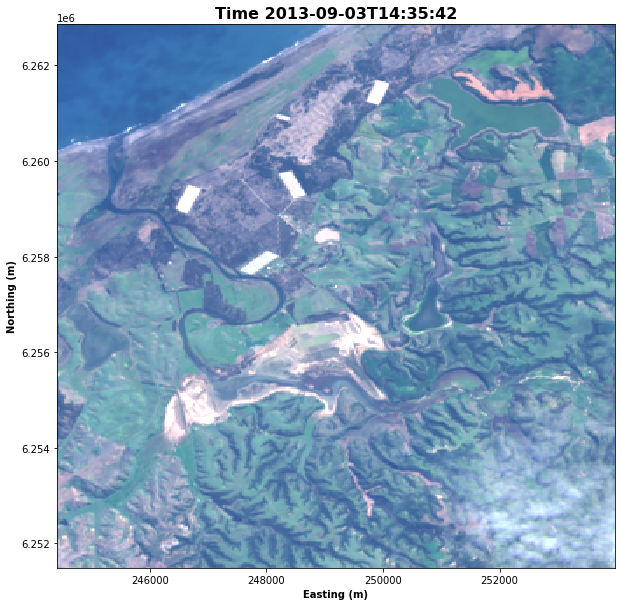

In [12]:
# Set the band combination to plot
bands = ["red", "green", "blue"]

# Format the time stamp for use as the plot title
time_string = str(dataset.time.isel(time=time_index).values).split('.')[0]  

dataset[bands].isel(time=time_index).to_array().plot.imshow(vmin=0,vmax=1500,figsize=(10,10))

# Set the title and axis labels
ax = plt.gca()
ax.set_title(f"Time {time_string}", fontweight='bold', fontsize=16)
ax.set_xlabel('Easting (m)', fontweight='bold')
ax.set_ylabel('Northing (m)', fontweight='bold')

# Display the plot
plt.show()

In [13]:
### Filter by level of aerosol/clouds covering the images
ds_coastal_aerosol = dataset.coastal_aerosol*0.0001
medias = ds_coastal_aerosol.mean(axis=[1,2]).values
goodSamples = [x for x in range(len(medias)) if medias[x] < 0.2]

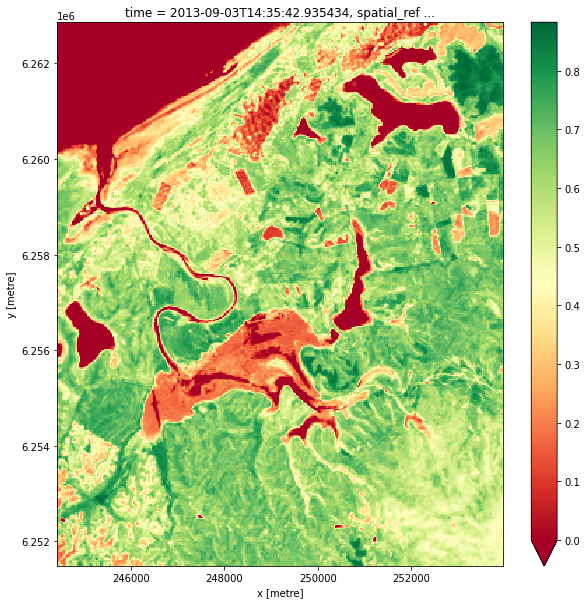

In [14]:
# Calculate the components that make up the NDVI calculation
band_diff = dataset.nir - dataset.red
band_sum = dataset.nir + dataset.red

# Calculate NDVI and store it as a measurement in the original dataset
ndvi = band_diff / band_sum

# This is the simple way to plot
# Note that high values are likely to be vegetation.
plt.figure(figsize=(10, 10))
ndvi.isel(time=time_index).plot(cmap="RdYlGn", vmin=0)
plt.show()

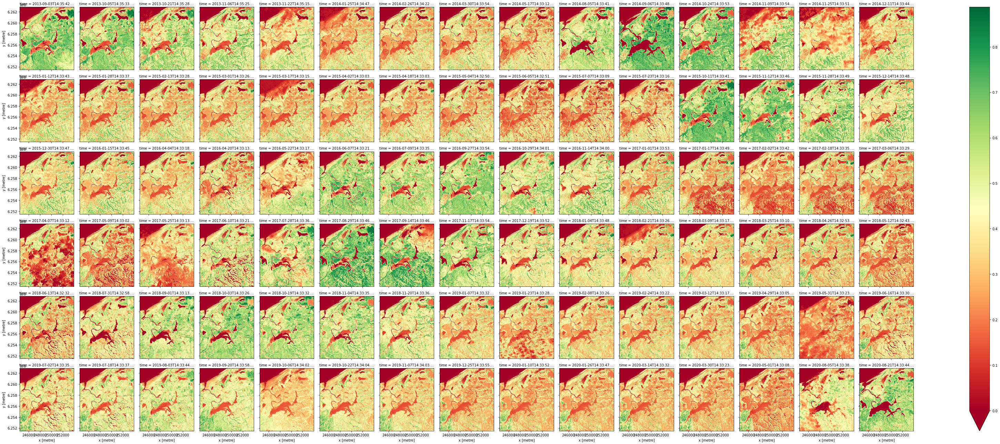

In [15]:
#ndvi.drop()?
ndvi[goodSamples].plot(col="time", col_wrap=15, cmap="RdYlGn", vmin=0)
plt.show()

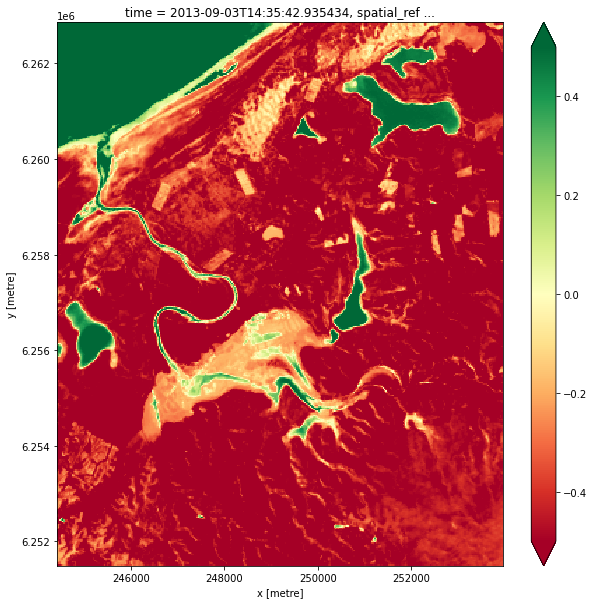

In [16]:
# Calculate the components that make up the NDWI calculation
band_diff = dataset.green - dataset.nir
band_sum = dataset.green + dataset.nir

# Calculate NDWI and store it as a measurement in the original dataset
ndwi = band_diff / band_sum

# This is the simple way to plot
# Note that high values are likely to be vegetation.
plt.figure(figsize=(10, 10))
ndwi.isel(time=time_index).plot(cmap="RdYlGn", vmin=-0.5)
plt.show()

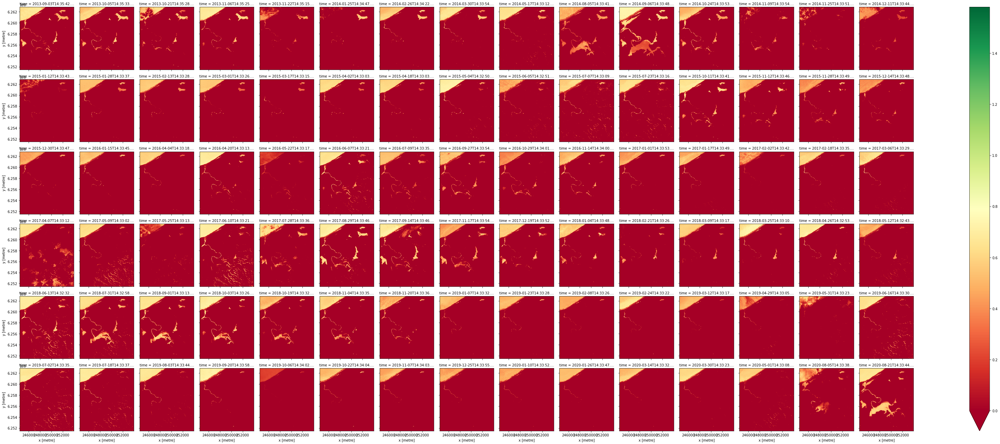

In [17]:
ndwi[goodSamples].plot(col="time", col_wrap=15, cmap="RdYlGn", vmin=0)
plt.show()

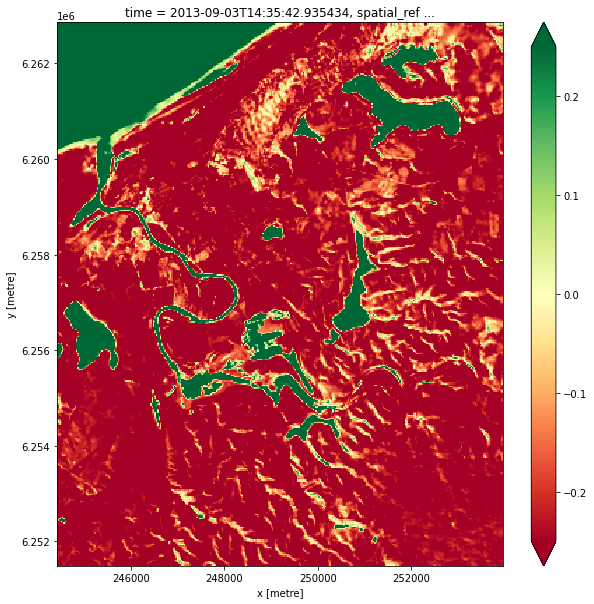

In [18]:
# Calculate the components that make up the MWDI calculation
band_diff = dataset.green - dataset.swir1
band_sum = dataset.green + dataset.swir1

# Calculate MWDI and store it as a measurement in the original dataset
mwdi = band_diff / band_sum

# This is the simple way to plot
# Note that high values are likely to be vegetation.
plt.figure(figsize=(10, 10))
mwdi.isel(time=time_index).plot(cmap="RdYlGn", vmin=-0.25)
plt.show()

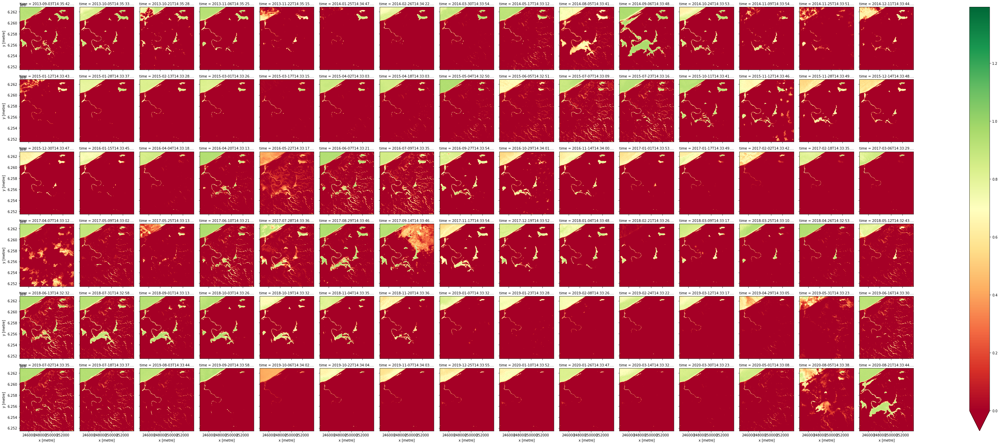

In [19]:
mwdi[goodSamples].plot(col="time", col_wrap=15, cmap="RdYlGn", vmin=0)
plt.show()

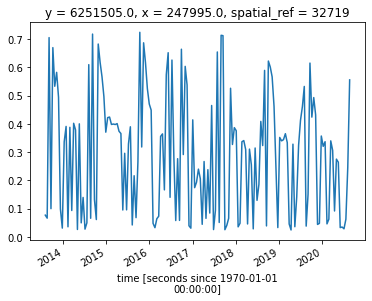

In [20]:
ndvi.sel(x=248000, y=6254, method='nearest').plot()

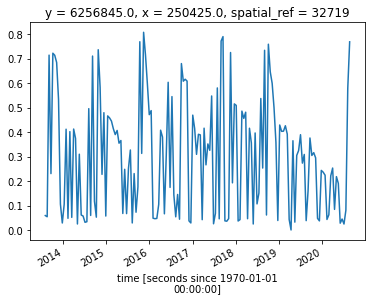

In [21]:
ndvi.isel(x=[200], y=[200]).plot()

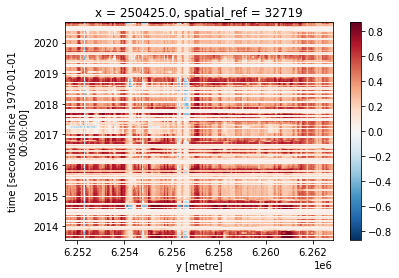

In [22]:
ndvi.isel(x=[200]).plot()